In [1]:
import cv2
import numpy as np
import face_recognition

In [2]:
list = [
    {
        'name': 'Biden',
        'file': 'Biden.jpg',
        'encode': None,
    },
    {
        'name': 'Trump',
        'file': 'Trump.jpg',
        'encode': None,
    },
]

In [3]:
for data in list:
    img = cv2.imread(data['file'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    data['encode'] = face_recognition.face_encodings(img)[0]

In [4]:
print(list)

[{'name': 'Biden', 'file': 'Biden.jpg', 'encode': array([-1.12458877e-01,  1.85328111e-01,  3.74379903e-02, -2.85645318e-03,
       -8.70562196e-02,  4.28944007e-02, -7.74461478e-02, -5.55520207e-02,
        4.68096733e-02,  8.97393283e-03,  2.18288273e-01, -6.82158172e-02,
       -3.16225052e-01,  4.30124532e-03,  3.77326012e-02,  1.27401516e-01,
       -1.21987201e-01, -9.33705270e-03, -2.05584899e-01, -8.41796249e-02,
        1.22713307e-02,  2.84039062e-02,  7.92913586e-02,  1.62479933e-04,
       -1.42206043e-01, -2.66835928e-01, -4.51906808e-02, -1.41682878e-01,
       -6.47656471e-02, -1.09411784e-01,  7.72227421e-02, -2.63709184e-02,
       -2.16653973e-01, -7.32588097e-02, -3.84567641e-02, -1.48037048e-02,
       -5.98085001e-02, -2.57160924e-02,  1.58696979e-01, -2.83060875e-03,
       -1.42536983e-01,  7.01217353e-02,  1.64640862e-02,  2.47958779e-01,
        2.81019598e-01,  2.97856014e-02, -3.20774317e-03, -7.26005360e-02,
        1.40026540e-01, -2.06722736e-01,  4.546950

In [5]:
data_encodes = [data['encode'] for data in list]
tolerance = 0.6

In [6]:
tests = ['Trump-1.jpg','Trump-2.jpg','Trump-3.jpg','Biden-1.jpg','Biden-2.jpg','Biden-3.jpg','Both-1.jpg']

In [7]:
for test in tests:
    img = cv2.imread(test)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    face_locates = face_recognition.face_locations(img)
    face_encodes = face_recognition.face_encodings(img, face_locates)
    
    for face_encode in face_encodes:
        face_distance_list = face_recognition.face_distance(data_encodes, face_encode)
        
        min_distance_index = np.argmin(face_distance_list)
        if face_distance_list[min_distance_index] < tolerance:
            result = list[min_distance_index]['name']
        else:
            result = 'unknown'
            
        distance_with_name_list = [(face_data['name'], round(distance, 4)) for face_data, distance in zip(list, face_distance_list)]
        print(f'辨識檔案: {test}, 辨識結果: {result}, 特徵距離: {distance_with_name_list}')

辨識檔案: Trump-1.jpg, 辨識結果: Trump, 特徵距離: [('Biden', 0.6642), ('Trump', 0.4884)]
辨識檔案: Trump-2.jpg, 辨識結果: Trump, 特徵距離: [('Biden', 0.6992), ('Trump', 0.526)]
辨識檔案: Trump-3.jpg, 辨識結果: Trump, 特徵距離: [('Biden', 0.7219), ('Trump', 0.4636)]
辨識檔案: Biden-1.jpg, 辨識結果: Biden, 特徵距離: [('Biden', 0.4343), ('Trump', 0.6393)]
辨識檔案: Biden-2.jpg, 辨識結果: Biden, 特徵距離: [('Biden', 0.4617), ('Trump', 0.5736)]
辨識檔案: Biden-3.jpg, 辨識結果: Biden, 特徵距離: [('Biden', 0.3718), ('Trump', 0.6498)]
辨識檔案: Both-1.jpg, 辨識結果: Biden, 特徵距離: [('Biden', 0.3478), ('Trump', 0.604)]
辨識檔案: Both-1.jpg, 辨識結果: Trump, 特徵距離: [('Biden', 0.6572), ('Trump', 0.417)]


In [8]:
BACKGROUND = (0, 255, 0)
WHITE = (255, 255, 255)

def draw_locations(img, match_results):
    for match_result in match_results:
        y1, x2, y2, x1 = match_result['location']
        cv2.rectangle(img, (x1, y1), (x2, y2), BACKGROUND, 2)
        cv2.rectangle(img, (x1, y2 + 35), (x2, y2), BACKGROUND, cv2.FILLED)
        cv2.putText(img, match_result['name'], (x1 + 10, y2 + 25), cv2.FONT_HERSHEY_SIMPLEX, 0.8, WHITE, 2)

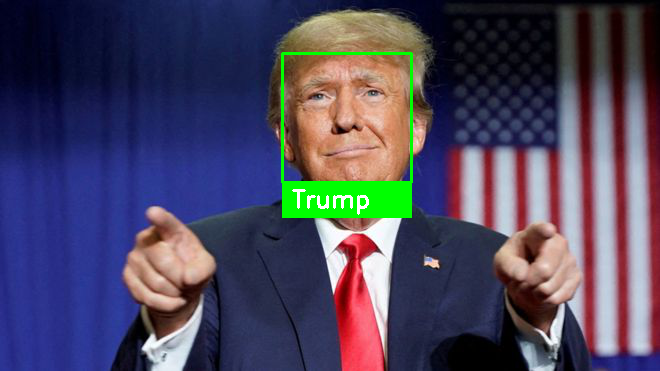

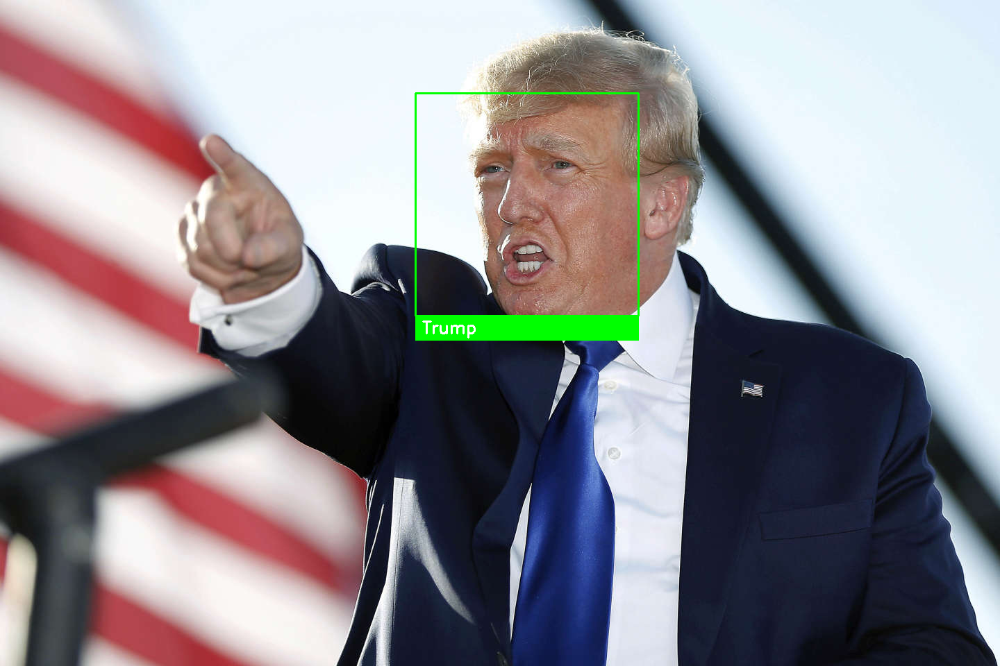

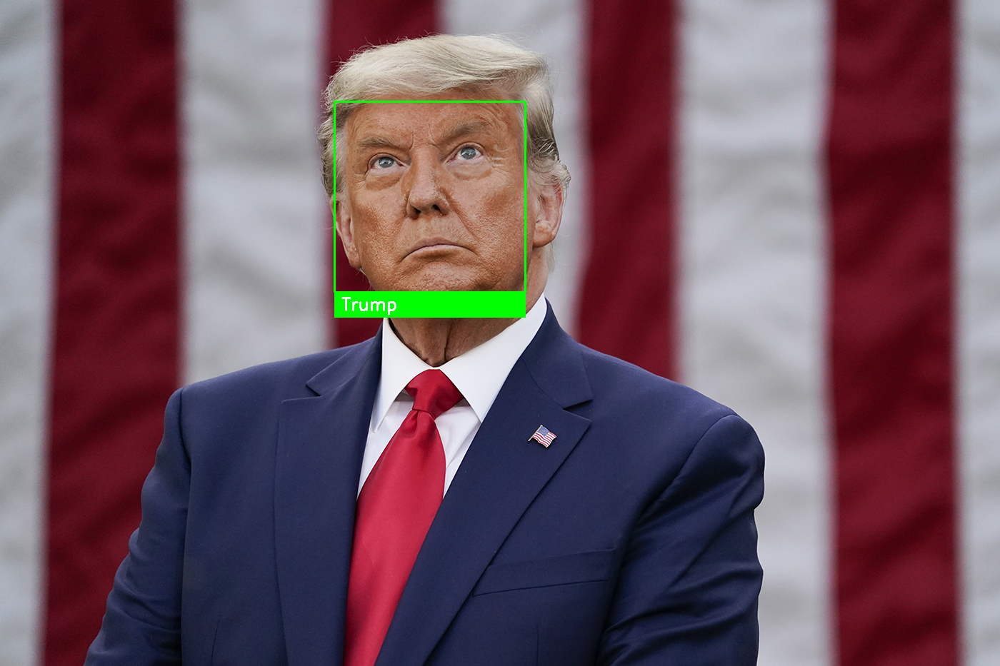

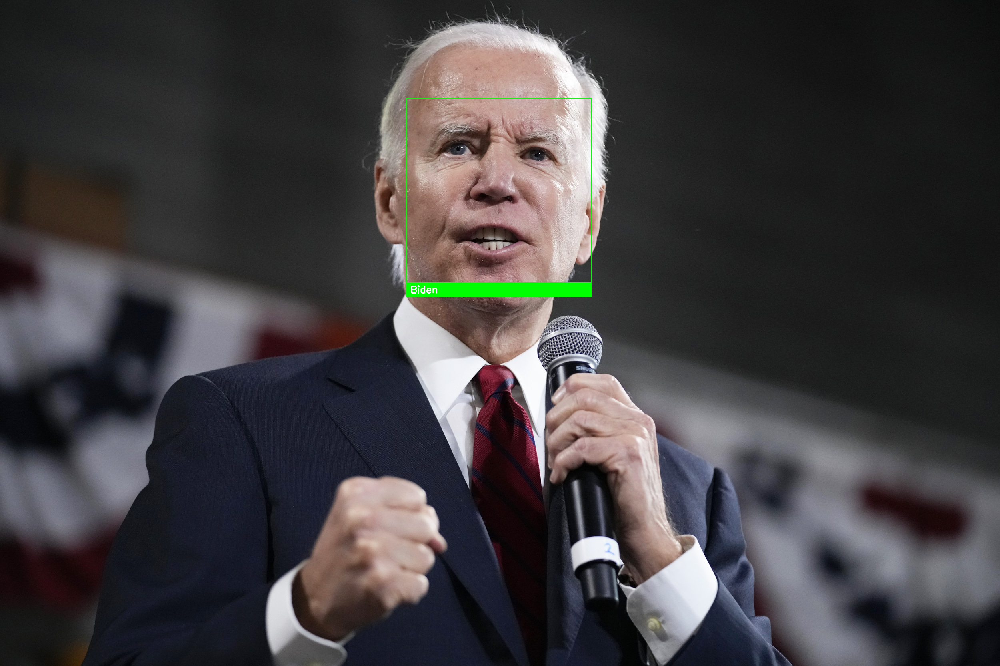

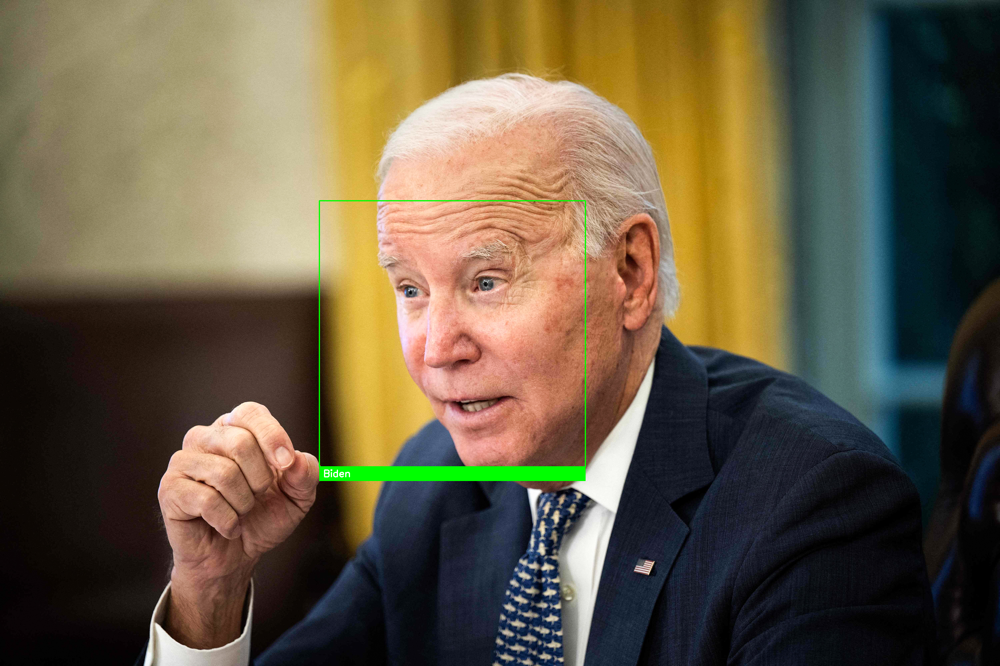

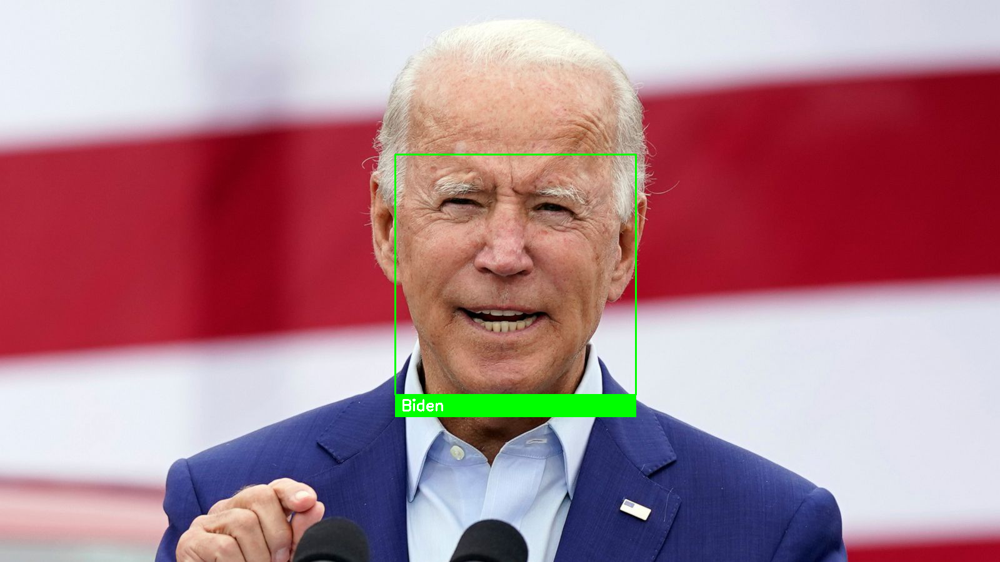

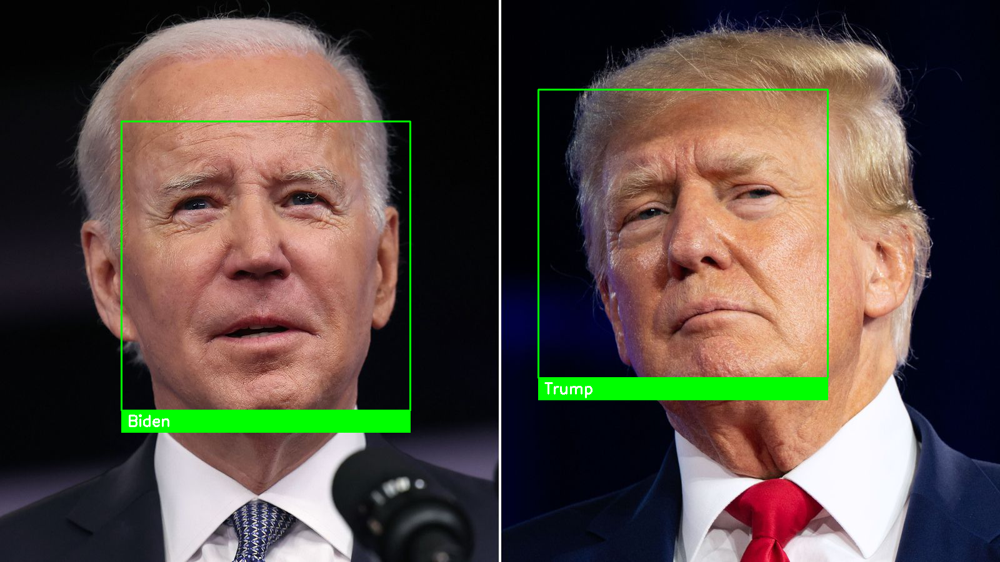

In [9]:
from IPython.display import display
from PIL import Image

for test in tests:
    matchs = []
    
    img = cv2.imread(test)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    face_locates = face_recognition.face_locations(img)
    face_encodes = face_recognition.face_encodings(img, face_locates)
    
    for face_encode, face_locate in zip(face_encodes, face_locates):
        face_distance_list = face_recognition.face_distance(data_encodes, face_encode)
        
        min_distance_index = np.argmin(face_distance_list)
        if face_distance_list[min_distance_index] < tolerance:
            name = list[min_distance_index]['name']
        else:
            name = 'unknown'
            
        matchs.append({
            'name': name,
            'location': face_locate,
        })
        
    draw_locations(img, matchs)
    display(Image.fromarray(img)) 